# Project Definition
We have a dataset of books in the form of a text file, and I need to carry out three main tasks:

1. EDA and handling missing values.
2. Compression of book summaries using NLP.
3. As a computer vision task, displaying an image using the summary of each book.

In this Jupyter notebook, I focus on a part of the first task, which is EDA.


# EDA

In [59]:
import pandas as pd
import re
import numpy as np
import ast
import os
from together import Together
from dotenv import load_dotenv
import time
import json
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS

### Extracting Essential Information Like Summaries and Metadata from "booksummaries.txt"

<div style="text-align: justify">
I've started delving into the `booksummaries.txt` file and discovered that each book follows a structured format from which we can extract valuable information. Here's a breakdown of the structure:

- **Starting Number:** Each book is numbered incrementally, ascending rather than following an arithmetic sequence, until the last book in the file.
- **Identification Pattern:** Following this number, there's a pattern of characters after `/m/`, likely serving as a unique identifier for that book in the database.
- **Metadata:** Following the identifier, We find details such as the book's title, author's name, publication date, and genres. Genres are consistently enclosed in curly braces `{}`. Some books may have missing information in these fields, representing missing values in our dataset. This section constitutes the metadata of each book.
- **Book Summary:** Following the metadata, each book includes a summary.

I've attempted to craft regex patterns to effectively extract complete metadata information for each book.

Let's explore and extract insights from this dataset!
</div>


In [7]:
# Open a the booksummaries.txt file for reading
with open('booksummaries.txt', 'r') as file:
    # Read the entire contents of the file
    file_contents = file.read()

In [8]:
# Extracting the metadata with regex
metadata_patern = r"\d+\s*\/m\/\w+.*}?\t+"
metadata_match = re.finditer(metadata_patern, file_contents)
metadata = []

for match in metadata_match:
    metadata.append(match.group())

In [9]:
len(metadata)

16559

In [18]:
# Extracting the whole information of books and
# storing each of them in a list
book_detail = r"^\d+.*(?=\n|$)"
bookinfo = re.finditer(book_detail, file_contents, re.MULTILINE)
bookinfos = []
for info in bookinfo:
    bookinfos.append(info.group())

In [19]:
len(bookinfos)

16559

In [237]:
bookinfos

['620\t/m/0hhy\tAnimal Farm\tGeorge Orwell\t1945-08-17\t{"/m/016lj8": "Roman \\u00e0 clef", "/m/06nbt": "Satire", "/m/0dwly": "Children\'s literature", "/m/014dfn": "Speculative fiction", "/m/02xlf": "Fiction"}\t Old Major, the old boar on the Manor Farm, calls the animals on the farm for a meeting, where he compares the humans to parasites and teaches the animals a revolutionary song, \'Beasts of England\'. When Major dies, two young pigs, Snowball and Napoleon, assume command and turn his dream into a philosophy. The animals revolt and drive the drunken and irresponsible Mr Jones from the farm, renaming it "Animal Farm". They adopt Seven Commandments of Animal-ism, the most important of which is, "All animals are equal". Snowball attempts to teach the animals reading and writing; food is plentiful, and the farm runs smoothly. The pigs elevate themselves to positions of leadership and set aside special food items, ostensibly for their personal health. Napoleon takes the pups from the 

### Formatting Book Metadata

<div style="text-align: justify">

After extracting the metadata of each book and storing it in a list named `metadata`, I leveraged the API provided by <a href="https://www.together.ai/">together.ai</a>. Together AI is a research-driven artificial intelligence company, contributing leading open-source research, models, and datasets to advance the frontier of AI. Additionally, I utilized the <a href="https://ollama.com/library/llama3:8b">Llama3-8B-In</a> large language model.

With a custom script, I extracted important information from the metadata of each book and formatted its output as a JSON object. Subsequently, I saved all the metadata of the books as JSON, utilizing keys such as `bookName`, `author`, `publishDate`, and `genres`, which were stored in a list named `bookinfo_json`. This data was then stored in a file named `bookinfo.json`.

Following this, I processed the extracted summaries of each book. I appended a new key named `summary` to the JSON object of each book, including its corresponding summary value. Lastly, I saved the modified JSON objects in a file named `bookInfo(withSummary).json`.

This process ensures structured and organized data representation for further analysis and exploration.
</div>

In [144]:
# The information of each book was extracted
# in JSON format with the help of together.ai.
bookinfo_json = []

In [231]:
# A prompt has been writen to extract the details
# of each book like its name, author, publish date,
# and genres in JSON format.

# Load environment variables from .env file
load_dotenv()

# Create client
client = Together(api_key=os.environ.get("TOGETHER_API_KEY"))

for book in metadata:
    response = client.chat.completions.create(
        model="meta-llama/Llama-3-8b-chat-hf",
        messages=[{"role": "user", "content": f"I want you to extract some of the characteristics of the book like its name, author, publish date, and genres in a JSON format. Take it into regard that the following text may not have all those mentioned characteristics in it and you must provide only the name of genres and not any special characters. The JSON keys must be 'bookName', 'author', 'publishDate', 'genres'. The answer must only be a JSON object. I don't want any additional information or explanation like 'Here is the extracted information in JSON format'. Make sure that every JSON object starts and ends with a curly brace!. The date must be in string format and not an integer and it doesn't have alphabetic characters. Make sure to enclose every field value. If you didn't find a value, fill it with 'Unknown'. Don't enclose field values with curly braces. Ignore the quotations of letters: {book}"}]
    )
    bookinfo_json.append(json.loads(response.choices[0].message.content))
    time.sleep(1)

[{'bookName': 'Animal Farm', 'author': 'George Orwell', 'publishDate': '1945-08-17', 'genres': ['Roman', 'Satire', "Children's literature", 'Speculative fiction', 'Fiction']}, {'bookName': 'A Clockwork Orange', 'author': 'Anthony Burgess', 'publishDate': '1962', 'genres': ['Science Fiction', 'Novella', 'Speculative fiction', 'Utopian and dystopian fiction', 'Satire', 'Fiction']}, {'bookName': 'The Plague', 'author': 'Albert Camus', 'publishDate': '1947', 'genres': ['Existentialism', 'Fiction', 'Absurdist fiction', 'Novel']}, {'bookName': 'An Enquiry Concerning Human Understanding', 'author': 'David Hume', 'publishDate': '1756', 'genres': ['Philosophy']}, {'bookName': 'A Fire Upon the Deep', 'author': 'Vernor Vinge', 'publishDate': '2080', 'genres': ['Hard science fiction', 'Science Fiction', 'Speculative fiction', 'Fantasy', 'Fiction']}, {'bookName': 'All Quiet on the Western Front', 'author': 'Erich Maria Remarque', 'publishDate': '1929-01-29', 'genres': ['War novel', 'Roman a clef']}

In [233]:
# The obtained information was written on
# a JASON file to be used later.
with open("./bookinfo.json", "w") as json_file:
    json.dump(bookinfo_json, json_file, indent=4)

In [24]:
# The metadata of each book was removed
# with the help of regex.
bookSummary = []
pattern_to_delete = r"\d+\s*\/m\/\w+.*}?\t+"
for book in bookinfos:
    bookSummary.append(re.sub(pattern_to_delete, "", book))
    

In [241]:
bookSummary

[' Old Major, the old boar on the Manor Farm, calls the animals on the farm for a meeting, where he compares the humans to parasites and teaches the animals a revolutionary song, \'Beasts of England\'. When Major dies, two young pigs, Snowball and Napoleon, assume command and turn his dream into a philosophy. The animals revolt and drive the drunken and irresponsible Mr Jones from the farm, renaming it "Animal Farm". They adopt Seven Commandments of Animal-ism, the most important of which is, "All animals are equal". Snowball attempts to teach the animals reading and writing; food is plentiful, and the farm runs smoothly. The pigs elevate themselves to positions of leadership and set aside special food items, ostensibly for their personal health. Napoleon takes the pups from the farm dogs and trains them privately. Napoleon and Snowball struggle for leadership. When Snowball announces his plans to build a windmill, Napoleon has his dogs chase Snowball away and declares himself leader. 

In [29]:
with open('./bookinfo.json', "r") as json_file:
    bookinfo_json = json.load(json_file)

In [31]:
# A new summary key was defiend in each JASON 
# objects in the bookinfo_json variable. The
# summary of each book was added.
for i, element in enumerate(bookinfo_json):
    element['summary'] = bookSummary[i]

In [36]:
bookinfo_json

[{'bookName': 'Animal Farm',
  'author': 'George Orwell',
  'publishDate': '1945-08-17',
  'genres': ['Roman',
   'Satire',
   "Children's literature",
   'Speculative fiction',
   'Fiction'],
  'summary': ' Old Major, the old boar on the Manor Farm, calls the animals on the farm for a meeting, where he compares the humans to parasites and teaches the animals a revolutionary song, \'Beasts of England\'. When Major dies, two young pigs, Snowball and Napoleon, assume command and turn his dream into a philosophy. The animals revolt and drive the drunken and irresponsible Mr Jones from the farm, renaming it "Animal Farm". They adopt Seven Commandments of Animal-ism, the most important of which is, "All animals are equal". Snowball attempts to teach the animals reading and writing; food is plentiful, and the farm runs smoothly. The pigs elevate themselves to positions of leadership and set aside special food items, ostensibly for their personal health. Napoleon takes the pups from the farm 

In [34]:
# The updated bookinfo_json was stored in 
# a new JSON file called bookInfo(withSummary).json.
with open("./bookInfo(withSummary).json", "w") as json_file:
    json.dump(bookinfo_json, json_file, indent=4)

### Data Cleaning and Analysis Process

I began by converting the data into a DataFrame using `bookinfo_json` and stored it in `df` for further analysis. Here's an overview of the steps taken:

1. **Genres Column:**
   - Replaced `['unkown']` or `['unknown']` entities with `np.nan`.
   - Counted the frequency of each genre in the dataset.
   - Visualized the genre distribution using a word cloud and a barplot.

2. **BookName Column:**
   - Replaced `'unkown'` or `'unknown'` entities with `np.nan`.
   - Removed conflicting patterns in the book names.
   - Created a word cloud for visualization.

3. **Author Column:**
   - Replaced `'unkown'` and `'unknown'` entities with `np.nan`.
   - Removed incorrect patterns.
   - Added visualization with a barplot and a word cloud.

4. **Publish Date Column:**
   - Addressed potential issues with incorrect output from Llama.
   - Handled cases where a number preceding the actual date may have been considered for `publishDate`.

The data cleaning process concluded at this stage, and the cleaned dataset was saved in `bookInfo.xlsx`.


In [35]:
df = pd.DataFrame(bookinfo_json)

In [112]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16559 entries, 0 to 16558
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   bookName     15790 non-null  object
 1   author       14130 non-null  object
 2   publishDate  10962 non-null  object
 3   genres       15022 non-null  object
 4   summary      16558 non-null  object
dtypes: object(5)
memory usage: 647.0+ KB


In [4]:
df.describe()

,bookName,author,publishDate,genres,summary
count,15790,14130,10962,15022,16558
unique,15534,4804,2644,2475,16531
top,Nemesis,Agatha Christie,2006,['Novel'],~Plot outline description~ --> <!--
freq,6,74,171,862,13


In [38]:
df['genres'].isin(["Unknown"]).any() and df['genres'].isin(["Unkown"]).any()

True

In [39]:
# Replace ["Unknown"] and ["Unkown"] with np.nan in column 'genres'
df['genres'] = df['genres'].apply(lambda x: np.nan if x == ['Unknown'] or x == ['Unkown'] else x)

In [40]:
# Replace empty sublists with np.nan
for i in range(df['genres'].shape[0]):
    if not df['genres'][i]:
        df['genres'][i] = np.nan

In [55]:
flat_genres = []
for genrelist in df['genres']:
    if not pd.isna(genrelist):  # Check if genrelist is not NaN
        try:
            genrelist = ast.literal_eval(genrelist)
            for genre in genrelist:
                flat_genres.append(genre)
        except (SyntaxError, ValueError):
            # Handle any exceptions that might occur during evaluation
            pass

In [56]:
flat_genres = [s.title().strip() for s in flat_genres]
flat_genres = pd.Series(flat_genres)

In [57]:
flat_genres.value_counts()

Fiction                4784
Speculative Fiction    4303
Science Fiction        3010
Novel                  2692
Fantasy                2565
                       ... 
Opera                     1
Italian Literature        1
Bangsian Fantasy          1
Space Western             1
Dreams                    1
Name: count, Length: 365, dtype: int64

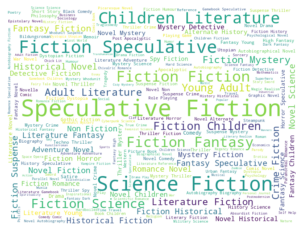

In [63]:
stopwords = STOPWORDS

text = flat_genres.to_string()
wc = WordCloud(
    background_color='white',
    stopwords=stopwords,
    height=600,
    width=800
)

wc.generate(text)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [86]:
# Calculate value counts and create DataFrame
genre_counts = flat_genres.value_counts().reset_index()

# Rename the columns
genre_counts.columns = ['Genre', 'Frequency']

# Reset the index to start from 0
genre_counts.reset_index(drop=True, inplace=True)

# Output the result
print(genre_counts)

                   Genre  Frequency
0                Fiction       4784
1    Speculative Fiction       4303
2        Science Fiction       3010
3                  Novel       2692
4                Fantasy       2565
..                   ...        ...
360                Opera          1
361   Italian Literature          1
362     Bangsian Fantasy          1
363        Space Western          1
364               Dreams          1

[365 rows x 2 columns]


/tmp/ipykernel_32249/1227431828.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


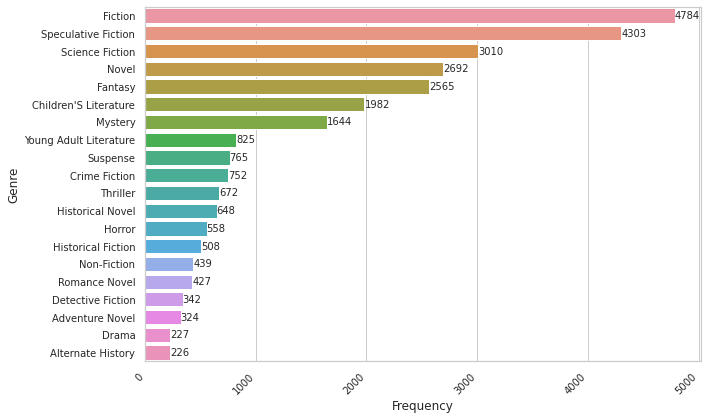

In [99]:
sns.set_style("whitegrid")
ax = sns.barplot(data=genre_counts[:20], x='Frequency', y='Genre', estimator="sum", errorbar=None, orient="h")

# Rotate x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Increase font size of x-axis, y-axis and bar labels
ax.set_xlabel(ax.get_xlabel(), fontsize=12)
ax.set_ylabel(ax.get_ylabel(), fontsize=12)
ax.bar_label(ax.containers[0], fontsize=10);
# Increase font size of tick labels
ax.tick_params(axis='both', which='major', labelsize=10)

# Adjust plot size
plt.gcf().set_size_inches(10, 6)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

In [42]:
# Replace "Unknown" and "Unkown" with np.nan in column 'bookName'
df['bookName'] = df['bookName'].replace({"Unknown": np.nan, "Unkown": np.nan})
# Replace non crucial /m/... patterns with empty string in column 'bookName'
df['bookName'] = df['bookName'].str.replace('/m/\w+', '', regex=True)
# Trim whitespace and remove surrounding quotations from values in column 'bookName'
df['bookName'] = df['bookName'].str.strip().str.replace('"', '')

In [87]:
incorrect_pattern_bookName = r'^m\/\w*|(?=[/])(?=[a-zA-Z])|/?\d{5,}|[{}]|^/(?=[a-zA-Z])'
bookName_column_without_na = df['bookName'].fillna('')
filtered_df_bookName = bookName_column_without_na[bookName_column_without_na.str.contains(incorrect_pattern_bookName, regex=True)]

In [88]:
filtered_df_bookName

531                               181325
1260                            m/02p0rg
1616                              771158
2157                             1147274
2412                             1349940
2459                             1379135
2954                 /1828929 Tiger Eyes
3122                             1963048
3161                             2008185
3457                 /2279237 Eye of Cat
3789                             2567031
3891                             2677483
3993                 /A Wild Sheep Chase
4078                             2848492
4123                             2894733
4138                             2912790
4173                             2956553
4186                             2973377
4219                             3015427
4292                             3088913
4680                             3470865
4835                             3608649
4863                             3639800
5122                             3974913
5145            

In [89]:
df['bookName'] = df['bookName'].str.replace(incorrect_pattern_bookName, '', regex=True)

In [105]:
second_incorrect_pattern_bookName = r'(?<![0-9/])/(?![0-9/])'
bookName_column_without_na = df['bookName'].fillna('')
filtered_df_bookName = bookName_column_without_na[bookName_column_without_na.str.contains(second_incorrect_pattern_bookName, regex=True)]
filtered_df_bookName

4491               Topdog/Underdog
10521                Ilium/Olympus
13226    Twenty-Six Lies/One Truth
16449      The Mother/Child Papers
Name: bookName, dtype: object

In [106]:
df['bookName'] = df['bookName'].str.replace(second_incorrect_pattern_bookName, ' ', regex=True)

In [108]:
incorrect_pattern_bookName = r'/'
bookName_column_without_na = df['bookName'].fillna('')
filtered_df_bookName = bookName_column_without_na[bookName_column_without_na.str.contains(incorrect_pattern_bookName, regex=True)]
filtered_df_bookName

4713                                     9/11: The Big Lie
5139                                    .hack//AI buster 2
6752     The One Percent Doctrine: Deep Inside America'...
9629                                           .hack//CELL
9689     The Princess Diaries, Volume VII and 3/4: Vale...
15891                                             11/22/63
Name: bookName, dtype: object

In [110]:
df['bookName'].iloc[15891] = np.nan

In [112]:
df['bookName'].value_counts()

bookName
                           47
Nemesis                     6
Inferno                     4
Haunted                     4
Outcast                     4
                           ..
The Redwall Cookbook        1
Polaroids from the Dead     1
Song of Lawino              1
Caedmon's Song              1
Poor Folk                   1
Name: count, Length: 15535, dtype: int64

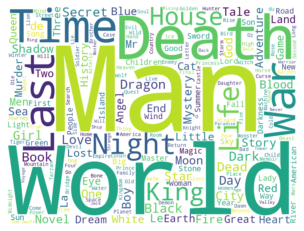

In [111]:
stopwords = STOPWORDS

text = df['bookName'].str.cat(sep=' ')
wc = WordCloud(
    background_color='white',
    stopwords=stopwords,
    height=600,
    width=800
)

wc.generate(text)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [44]:
# Replace "Unknown" and "Unkown" with np.nan in column 'author'
df['author'] = df['author'].replace({"Unknown": np.nan, "Unkown": np.nan})
# Replace any pattern that starts with "/m/" followed by any sequence of alphanumeric characters
df['author'] = df['author'].replace(r'/m/[a-zA-Z0-9]+', '', regex=True)
# Replace empty strings with np.nan
df['author'] = df['author'].replace([""], np.nan)
# Trim whitespace and remove surrounding quotations from values in column 'author'
df['author'] = df['author'].str.strip().str.replace('"', '')

In [115]:
# Define the regex pattern to match rows containing "_", "{", and "/"
pattern = r'[_{}\/]'
author_column_without_na = df['author'].fillna('')
filtered_df_author = author_column_without_na[author_column_without_na.str.contains(pattern, regex=True)]


In [116]:
filtered_df_author

1356                    m/02wc8y
2954     /1828929_795 Judy Blume
3457      /2279237 Roger Zelazny
3993            /Haruki Murakami
5724         /4623256 Kent Haruf
6098              _jg8 Joe Dever
6258             /Philip K. Dick
6499              {Walter Scott}
6558       _9 Charles R. Jackson
6821                        _qf1
6830            _2 C. J. Cherryh
7051                          _1
7229                    /6245649
7246         _52g Bruce Sterling
12183                  m/043ntrn
Name: author, dtype: object

In [117]:
replace_pattern_author = r'\w?\/\d\w*|[{}/]|[_]\w+'
df['author'] = df['author'].str.replace(pattern, '', regex=True)

In [118]:
pattern = r'[_{}\/]'
author_column_without_na = df['author'].fillna('')
filtered_df_author = author_column_without_na[author_column_without_na.str.contains(pattern, regex=True)]

In [119]:
filtered_df_author

Series([], Name: author, dtype: object)

In [120]:
df['author'].value_counts()

author
Agatha Christie         74
Franklin W. Dixon       67
K. A. Applegate         62
Stephen King            60
Edgar Rice Burroughs    55
                        ..
Hayden V. White          1
Gabrielle Roy            1
Clay Aiken               1
Josephine Hart           1
Stephen Colbert          1
Name: count, Length: 4804, dtype: int64

In [100]:
# Calculate value counts and create DataFrame
author_counts = df['author'].value_counts().reset_index()

# Rename the columns
author_counts.columns = ['Author', 'Frequency']

# Reset the index to start from 0
author_counts.reset_index(drop=True, inplace=True)

# Output the result
print(author_counts)

                    Author  Frequency
0          Agatha Christie         74
1        Franklin W. Dixon         67
2          K. A. Applegate         62
3             Stephen King         60
4     Edgar Rice Burroughs         55
...                    ...        ...
4799       Hayden V. White          1
4800         Gabrielle Roy          1
4801            Clay Aiken          1
4802        Josephine Hart          1
4803       Stephen Colbert          1

[4804 rows x 2 columns]


/tmp/ipykernel_32249/2130158604.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


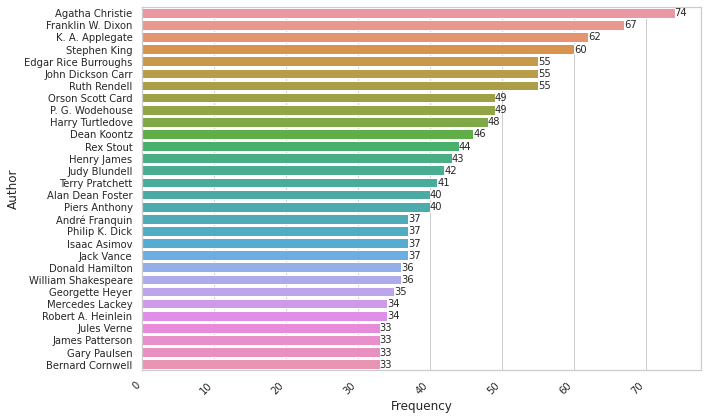

In [109]:
sns.set_style("whitegrid")
ax = sns.barplot(data=author_counts[:30], x='Frequency', y='Author', estimator="sum", errorbar=None, orient='h')

# Rotate x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Increase font size of x-axis, y-axis and bar labels
ax.set_xlabel(ax.get_xlabel(), fontsize=12)
ax.set_ylabel(ax.get_ylabel(), fontsize=12)
ax.bar_label(ax.containers[0], fontsize=10);
# Increase font size of tick labels
ax.tick_params(axis='both', which='major', labelsize=10)

# Adjust plot size
plt.gcf().set_size_inches(10, 6)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

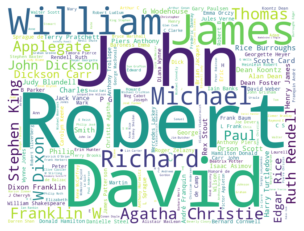

In [110]:
stopwords = STOPWORDS

text = df['author'].str.cat(sep=' ')
wc = WordCloud(
    background_color='white',
    stopwords=stopwords,
    height=600,
    width=800
)

wc.generate(text)
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [46]:
df["publishDate"]

0        1945-08-17
1              1962
2              1947
3              1756
4              2080
            ...    
16554    2012-09-25
16555    2000-06-01
16556    2010-11-16
16557    2012-10-02
16558          1846
Name: publishDate, Length: 16559, dtype: object

In [49]:
firstNumberPattern = r"\d+\s+/"
refined_metadata = []
for item in metadata:
    refined_metadata.append(re.sub(firstNumberPattern, "", item))

In [50]:
refined_metadata

['m/0hhy\tAnimal Farm\tGeorge Orwell\t1945-08-17\t{"/m/016lj8": "Roman \\u00e0 clef", "/m/06nbt": "Satire", "/m/0dwly": "Children\'s literature", "/m/014dfn": "Speculative fiction", "/m/02xlf": "Fiction"}\t',
 'm/0k36\tA Clockwork Orange\tAnthony Burgess\t1962\t{"/m/06n90": "Science Fiction", "/m/0l67h": "Novella", "/m/014dfn": "Speculative fiction", "/m/0c082": "Utopian and dystopian fiction", "/m/06nbt": "Satire", "/m/02xlf": "Fiction"}\t',
 'm/0ldx\tThe Plague\tAlbert Camus\t1947\t{"/m/02m4t": "Existentialism", "/m/02xlf": "Fiction", "/m/0pym5": "Absurdist fiction", "/m/05hgj": "Novel"}\t',
 'm/0sww\tAn Enquiry Concerning Human Understanding\tDavid Hume\t\t\t',
 'm/0wkt\tA Fire Upon the Deep\tVernor Vinge\t\t{"/m/03lrw": "Hard science fiction", "/m/06n90": "Science Fiction", "/m/014dfn": "Speculative fiction", "/m/01hmnh": "Fantasy", "/m/02xlf": "Fiction"}\t',
 'm/0x5g\tAll Quiet on the Western Front\tErich Maria Remarque\t1929-01-29\t{"/m/098tmk": "War novel", "/m/016lj8": "Roman \

In [51]:
year_pattern = r"\s+\d{4}(?:-\d{2})?(?:-\d{2})?\s+"
# \s+\d{4}(?:-\d{2})?(?:-\d{2})?\s+
year = []
for item in refined_metadata:
    year.append(re.findall(year_pattern, item))

In [52]:
year

[['\t1945-08-17\t'],
 ['\t1962\t'],
 ['\t1947\t'],
 [],
 [],
 ['\t1929-01-29\t'],
 ['\t1968\t'],
 [],
 ['\t1996-10-01\t'],
 ['\t1995-10-01\t'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['\t1973\t'],
 ['\t1976\t'],
 ['\t1759-01\t'],
 ['\t1985-04\t'],
 ['\t1872\t'],
 ['\t1985\t'],
 ['\t1897\t'],
 ['\t1605\t'],
 [],
 ['\t1969\t'],
 ['\t1995\t'],
 [],
 [],
 ['\t1925\t'],
 ['\t\t1915\t'],
 ['\t1953\t'],
 [],
 ['\t1935\t'],
 [],
 ['\t1981-05-28\t'],
 [],
 ['\t1936-06-30\t'],
 ['\t1899\t'],
 [],
 ['\t1984\t'],
 ['\t1884\t'],
 ['\t1819\t'],
 ['\t1939\t'],
 ['\t1984\t'],
 [],
 [],
 [],
 ['\t1995-06\t'],
 ['\t1851-10-18\t'],
 ['\t1898\t'],
 ['\t1984-07-01\t'],
 ['\t1999\t'],
 ['\t2000-01\t'],
 [],
 [],
 ['\t1832\t\t'],
 ['\t1965\t'],
 ['\t1959\t'],
 ['\t1977\t'],
 ['\t1985\t'],
 ['\t1813-01-28\t'],
 [],
 [],
 [],
 ['\t1967\t'],
 ['\t1970\t'],
 [],
 ['\t1972\t'],
 ['\t1811\t'],
 ['\t1986\t'],
 ['\t1959-12\t'],
 ['\t2007\t'],
 ['\t1945\t'],
 [],
 ['\t1954\t'],
 ['\t1895\t'],
 ['\t1975\t'

In [53]:
filtered_lists = [(idx, lst) for idx, lst in enumerate(year) if len(lst) > 1]

In [54]:
filtered_lists

[(1260, ['\t1876\t', '\t1976\t']),
 (1570, ['\t1632\t', '\t2000-02-01\t']),
 (3769, [' 1973\t', '\t1980-06\t']),
 (4018, [' 2042\t', '\t1986\t']),
 (4652, ['\t2150 ', '\t\t1976-06\t']),
 (4660, [' 1939\t', '\t1978\t']),
 (5593, ['\t1633\t', '\t2002-08\t']),
 (6686, [' 2000 ', '\t1889\t']),
 (6992, [' 2020\t', '\t1991-02\t']),
 (7112, [' 1963\t', '\t1995\t']),
 (7680, ['\t1945\t', '\t1995-08-01\t']),
 (8094, [' 1793\t', '\t2000\t']),
 (8140, [' 1966\t', '\t1971-03-23\t']),
 (8730, [' 1850\t', '\t2004-12\t']),
 (10023, ['\t1945\t', '\t2007-05-29\t']),
 (10794, ['\t2666\t', '\t2004\t']),
 (11163, [' 2262\t', '\t1973\t']),
 (11891, [' 2083\t', '\t2005\t']),
 (15017, [' 2033\t', '\t2002\t']),
 (15492, [' 1945\t', '\t2010-02-23\t']),
 (15933, ['\t1001 ', '\t\t2011-03\t\t']),
 (16137, [' 1811 ', '\t\t2011-05\t']),
 (16249, [' 1999\t', '\t1974\t']),
 (16328, [' 2020\t', '\t2011\t']),
 (16398, [' 5000 ', '\t\t2011\t\t'])]

In [55]:
for sublist in year:
    if len(sublist) > 1:
        del sublist[0]

In [56]:
# Replace empty sublists with np.nan
for i in range(len(year)):
    if not year[i]:
        year[i] = np.nan

In [57]:
# Strip spaces before and after the dates, but continue if sublist is np.nan
year = [[date.strip() for date in sublist] if isinstance(sublist, list) else sublist for sublist in year]

In [58]:
year

[['1945-08-17'],
 ['1962'],
 ['1947'],
 nan,
 nan,
 ['1929-01-29'],
 ['1968'],
 nan,
 ['1996-10-01'],
 ['1995-10-01'],
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 ['1973'],
 ['1976'],
 ['1759-01'],
 ['1985-04'],
 ['1872'],
 ['1985'],
 ['1897'],
 ['1605'],
 nan,
 ['1969'],
 ['1995'],
 nan,
 nan,
 ['1925'],
 ['1915'],
 ['1953'],
 nan,
 ['1935'],
 nan,
 ['1981-05-28'],
 nan,
 ['1936-06-30'],
 ['1899'],
 nan,
 ['1984'],
 ['1884'],
 ['1819'],
 ['1939'],
 ['1984'],
 nan,
 nan,
 nan,
 ['1995-06'],
 ['1851-10-18'],
 ['1898'],
 ['1984-07-01'],
 ['1999'],
 ['2000-01'],
 nan,
 nan,
 ['1832'],
 ['1965'],
 ['1959'],
 ['1977'],
 ['1985'],
 ['1813-01-28'],
 nan,
 nan,
 nan,
 ['1967'],
 ['1970'],
 nan,
 ['1972'],
 ['1811'],
 ['1986'],
 ['1959-12'],
 ['2007'],
 ['1945'],
 nan,
 ['1954'],
 ['1895'],
 ['1975'],
 ['1977-01'],
 nan,
 ['1901'],
 ['1937'],
 ['1945'],
 ['1942'],
 ['1842'],
 ['1984'],
 ['1988'],
 nan,
 ['1955'],
 ['1981'],
 ['1890'],
 nan,
 ['1951'],
 ['1979'],
 ['1954'],
 ['1

In [59]:
for i, sublist in enumerate(year):
    if isinstance(sublist, list):
        year[i] = sublist[0]
    else:
        continue

In [60]:
year

['1945-08-17',
 '1962',
 '1947',
 nan,
 nan,
 '1929-01-29',
 '1968',
 nan,
 '1996-10-01',
 '1995-10-01',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 '1973',
 '1976',
 '1759-01',
 '1985-04',
 '1872',
 '1985',
 '1897',
 '1605',
 nan,
 '1969',
 '1995',
 nan,
 nan,
 '1925',
 '1915',
 '1953',
 nan,
 '1935',
 nan,
 '1981-05-28',
 nan,
 '1936-06-30',
 '1899',
 nan,
 '1984',
 '1884',
 '1819',
 '1939',
 '1984',
 nan,
 nan,
 nan,
 '1995-06',
 '1851-10-18',
 '1898',
 '1984-07-01',
 '1999',
 '2000-01',
 nan,
 nan,
 '1832',
 '1965',
 '1959',
 '1977',
 '1985',
 '1813-01-28',
 nan,
 nan,
 nan,
 '1967',
 '1970',
 nan,
 '1972',
 '1811',
 '1986',
 '1959-12',
 '2007',
 '1945',
 nan,
 '1954',
 '1895',
 '1975',
 '1977-01',
 nan,
 '1901',
 '1937',
 '1945',
 '1942',
 '1842',
 '1984',
 '1988',
 nan,
 '1955',
 '1981',
 '1890',
 nan,
 '1951',
 '1979',
 '1954',
 '1871',
 '1952',
 '1964',
 '1982-01',
 nan,
 '1943',
 '1667',
 nan,
 '1897',
 '1869',
 '1936',
 nan,
 '1996',
 '1942',
 nan,
 nan,
 '18

In [61]:
df["publishDate"] = year

In [140]:
df

,bookName,author,publishDate,genres,summary
0,Animal Farm,George Orwell,1945-08-17,"['Roman', 'Satire', ""Children's literature"", '...","Old Major, the old boar on the Manor Farm, ca..."
1,A Clockwork Orange,Anthony Burgess,1962,"['Science Fiction', 'Novella', 'Speculative fi...","Alex, a teenager living in near-future Englan..."
2,The Plague,Albert Camus,1947,"['Existentialism', 'Fiction', 'Absurdist ficti...",The text of The Plague is divided into five p...
3,An Enquiry Concerning Human Understanding,David Hume,NaN,['Philosophy'],The argument of the Enquiry proceeds by a ser...
4,A Fire Upon the Deep,Vernor Vinge,NaN,"['Hard science fiction', 'Science Fiction', 'S...",The novel posits that space around the Milky ...
...,...,...,...,...,...
16554,Under Wildwood,Colin Meloy,2012-09-25,['Fantasy'],"Prue McKeel, having rescued her brother from ..."
16555,Transfer of Power,Vince Flynn,2000-06-01,"['Thriller', 'Fiction']",The reader first meets Rapp while he is doing...
16556,Decoded,Jay-Z,2010-11-16,['Autobiography'],The book follows very rough chronological ord...
16557,America Again: Re-becoming The Greatness We Ne...,Stephen Colbert,2012-10-02,['Non-Fiction'],Colbert addresses topics including Wall Stree...


In [121]:
df.to_excel('./bookInfo.xlsx', index=False)

I used `ydata_profiling` for reporting on the dataset I have. This library is a very good tool for Exploratory Data Analysis (EDA) and provides very useful analyses regarding the data you have. I saved the generated report by this library in `bookReport.html`. According to the report, 12.5% of the dataset we have consists of missing values, and I have addressed the issue of missing values in another Jupyter notebook file called `MissingValue.ipynb`.


In [2]:
df = pd.read_excel('bookInfo.xlsx')

In [4]:
profile = ProfileReport(df, title='Book Summary Report')
profile.config.vars.cat.stop_words = STOPWORDS

In [5]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
profile.to_file("bookReport.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]